In [1]:
import numpy as np
import random
import matplotlib.pyplot as plt

In [2]:
# Actions
ACTIONS = ['Up', 'Down', 'Left', 'Right']

alpha = 0.1  # Learning rate
gamma = 0.9  # Discount factor
epsilon = 0.3  # Epsilon for epsilon-greedy action selection
n_episodes = 25

In [3]:
# Grid size
grid_size = 10

green_cell  = 100   # goal
blue_cell   = 50    # Starting point

white_cell  = -5    # normal cells
orange_cell = -15   # penalty cells
black_cell  = 0  # obstacle cells

### Create Grid 

In [4]:
# Initially, all are white cells
Grid = np.full((grid_size, grid_size), white_cell)  
        
# Randomly assign black cells => obstacles
num_black_cells = random.randint(5, 10)  
for _ in range(num_black_cells):
    black_x = random.randint(0, grid_size-1)
    black_y = random.randint(0, grid_size-1)
    Grid[black_x, black_y] = black_cell

# Randomly assign orange cells => penalty cells
num_orange_cells = random.randint(5, 10)  
for _ in range(num_orange_cells):
    orange_x = random.randint(0, grid_size-1)
    orange_y = random.randint(0, grid_size-1)
    
    # Only place orange in a white cell
    if Grid[orange_x, orange_y] == white_cell:  
        Grid[orange_x, orange_y] = orange_cell
        
# Randomly assign green cell => goal cell
green_x = random.randint(0, grid_size-1)
green_y = random.randint(0, grid_size-1)
Grid[green_x,green_y] = green_cell

# Randomly assign blue cell => starting cell
blue_x = random.randint(0, grid_size-1)
blue_y = random.randint(0, grid_size-1)
Grid[blue_x, blue_y] = blue_cell

### If all cells surrounding green are black, convert one to white 

In [5]:
surrounding_directions = [(-1, 0), (1, 0), (0, -1), (0, 1)]

# Check if all surrounding cells are black
all_surrounded = True
for dx, dy in surrounding_directions:
    nx, ny = green_x + dx, green_y + dy
    if 0 <=nx<grid_size and 0 <=ny<grid_size:
        if Grid[nx, ny] != black_cell:
            all_surrounded = False
            break

# If all cells surrounding the green cell are black, change one to white
if all_surrounded:
    # Pick the first valid surrounding cell and change it to white
    for dx, dy in surrounding_directions:
        nx, ny = green_x + dx, green_y + dy
        if 0 <= nx < grid_size and 0 <= ny < grid_size:
            Grid[nx, ny] = white_cell
            break

### If all cells surrounding blue are black, convert one to white 

In [6]:
surrounding_directions = [(-1, 0), (1, 0), (0, -1), (0, 1)]

# Check if all surrounding cells are black
all_surrounded = True
for dx, dy in surrounding_directions:
    nx, ny = blue_x + dx, blue_y + dy
    if 0 <=nx<grid_size and 0 <=ny<grid_size:
        if Grid[nx, ny] != black_cell:
            all_surrounded = False
            break

# If all cells surrounding the green cell are black, change one to white
if all_surrounded:
    # Pick the first valid surrounding cell and change it to white
    for dx, dy in surrounding_directions:
        nx, ny = blue_x + dx, blue_y + dy
        if 0 <= nx < grid_size and 0 <= ny < grid_size:
            Grid[nx, ny] = white_cell
            break

### Plot Grid 

In [7]:
color_map = {
        white_cell  : 'white',
        green_cell  : 'green',
        orange_cell : 'orange',
        black_cell  : 'black',
        blue_cell   : 'blue'
}

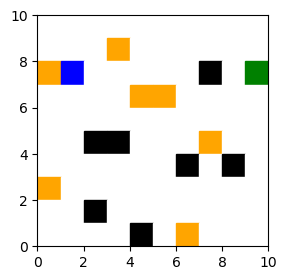

In [8]:
plt.figure(figsize=(3,3))
for x in range(grid_size):
    for y in range(grid_size):
        cell_color = color_map.get(Grid[x, y], 'white')
        plt.gca().add_patch(plt.Rectangle((y, grid_size-x-1), 1, 1, 
                                          color=cell_color))
    
plt.xlim(0, grid_size)
plt.ylim(0, grid_size)
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

### Q-Table 

Each cell in the Q-table will have corresponding Q-value for all 4 actions, </br> making it a 3d matrix with 4 being the third dimension

In [9]:
Q = np.zeros((grid_size, grid_size, len(ACTIONS)))
Q = Q.astype(int)
#Q

In [10]:
Q.shape

(10, 10, 4)

In [11]:
episode_list = []

### Algorithm 

1. Let initial_state = state </br>
2. Let total_reward = 0 </br>
3. If probability < epsilon, do exploration, else exploitation </br>
4. Based on action chosen, calculate next possible state </br>
5. If next possible state is not valid, don't go for it => next state = current state </br>
   If next possible state is valid, then </br>
   choose the next possible state calculated only if probability < 80% </br>
   compute and choose alternative next possible state if the probability > 80% </br>
   
6. Calculate reward for next state </br>
7. Update the Q-value for current state based on reward for current state, </br>Q- value of next state , gamma value and alpha value </br>
8. Update states so that next possible state calculated is current state </br>
9. If current state is goal cell, finish that particular episode </br>
10. Run the algorithm for required number of episodes </br>
11. Display the policy for each cell based on Q-value </br>

In [12]:
for episode in range(n_episodes):  
    state = (blue_x, blue_y)
    total_reward = 0

    while True:
        
        '''Epsilon-greedy action selection for exploration-exploitation'''
    
        #If probability < epsilon, it chooses a random action for exploration
        if random.uniform(0, 1) < epsilon:
            action = random.choice(ACTIONS)  
        else:
            # Else chooses an action with highest Q-value for exploitation
            action = ACTIONS[  np.argmax(  Q[state[0], state[1]]  )  ]
        print("action : ", action)
        action_index = ACTIONS.index(action)
        print("action_index : ", action_index)

        # Define movements for each action
        x, y = state
        print("Current state :  ", (x,y))
        
        '''Up    : move up by decreasing row index by 1
           Down  : move down by increasing row index by 1
           Left  : move left by decreasing column index by 1
           Right : move right by increasing column index by 1'''
        actions = {'Up':(-1, 0),'Down':(1, 0),'Left':(0, -1),'Right':(0, 1)}
        
        # Compute the possible next state
        intended_move = actions[action]
        intended_state = (x + intended_move[0], y + intended_move[1])
        print("intended state : ", intended_state)

        # Check if intended state is valid
        '''
        If the agent goes out of bounds or is about to go into a black cell,
        Then do not go into the intended_state, current_state = next_state too
        
        If the intended_movie is valid,
        then, with 80% probability, move into the intended state
        or with 20% probability, move into another state from remaining
        three options available
        '''
        next_x,next_y = intended_state
        if not (0<=next_x<grid_size and 0<=next_y<grid_size) or Grid[next_x,next_y] == black_cell:
            next_state = state  
        else:
            # Move with 80% probability in the intended direction
            if random.random() < 0.8:
                next_state = intended_state
            else:
                # 20% chance of random valid move
                valid_moves = [a for a in actions if a != action]
                for move in valid_moves.copy():
                    temp_state = (x + actions[move][0], y + actions[move][1])
                    
                    # check if the alternative move chosen is valif or not
                    # if it is not valid, remove it
                    if not (0<=temp_state[0]<grid_size and 0<=temp_state[1] <grid_size) or Grid[temp_state[0], temp_state[1]] == black_cell:
                        valid_moves.remove(move)
                        
                # from all valid moves in the list, choose one randomly
                # if valid moves is empty, current_state will be next_state again
                if valid_moves:
                    random_move = random.choice(valid_moves)
                    next_state = (x + actions[random_move][0], y + actions[random_move][1])
                else:
                    next_state = state

        nx,ny = next_state
        
        # Get the reward
        if Grid[nx,ny] != black_cell:
            reward = Grid[nx,ny]
        else:
            reward=0

        total_reward += reward

        # Update Q-value
        next_action_val = np.max(Q[nx, ny])
        Q[state[0],state[1], action_index] += alpha * (
            reward + gamma * next_action_val - Q[state[0],state[1],action_index]
        )

        # Move to the next state
        state = next_state
        print()

        # Check if goal state (green cell) is reached
        if Grid[state[0], state[1]] == green_cell:
            break

    episode_list.append(f"Episode {episode+1}/25, Total reward: {total_reward}")

action :  Up
action_index :  0
Current state :   (2, 1)
intended state :  (1, 1)

action :  Down
action_index :  1
Current state :   (2, 0)
intended state :  (3, 0)

action :  Up
action_index :  0
Current state :   (3, 0)
intended state :  (2, 0)

action :  Up
action_index :  0
Current state :   (2, 0)
intended state :  (1, 0)

action :  Up
action_index :  0
Current state :   (1, 0)
intended state :  (0, 0)

action :  Up
action_index :  0
Current state :   (0, 0)
intended state :  (-1, 0)

action :  Left
action_index :  2
Current state :   (0, 0)
intended state :  (0, -1)

action :  Up
action_index :  0
Current state :   (0, 0)
intended state :  (-1, 0)

action :  Up
action_index :  0
Current state :   (0, 0)
intended state :  (-1, 0)

action :  Up
action_index :  0
Current state :   (0, 0)
intended state :  (-1, 0)

action :  Up
action_index :  0
Current state :   (0, 0)
intended state :  (-1, 0)

action :  Up
action_index :  0
Current state :   (0, 0)
intended state :  (-1, 0)

actio

action :  Left
action_index :  2
Current state :   (2, 2)
intended state :  (2, 1)

action :  Right
action_index :  3
Current state :   (2, 1)
intended state :  (2, 2)

action :  Left
action_index :  2
Current state :   (2, 2)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (2, 1)
intended state :  (3, 1)

action :  Left
action_index :  2
Current state :   (3, 1)
intended state :  (3, 0)

action :  Up
action_index :  0
Current state :   (3, 0)
intended state :  (2, 0)

action :  Right
action_index :  3
Current state :   (2, 0)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (2, 1)
intended state :  (3, 1)

action :  Left
action_index :  2
Current state :   (2, 2)
intended state :  (2, 1)

action :  Right
action_index :  3
Current state :   (3, 2)
intended state :  (3, 3)

action :  Down
action_index :  1
Current state :   (3, 3)
intended state :  (4, 3)

action :  Up
action_index :  0
Current state :   (4, 3)
intended state :  (


action :  Right
action_index :  3
Current state :   (0, 0)
intended state :  (0, 1)

action :  Right
action_index :  3
Current state :   (1, 0)
intended state :  (1, 1)

action :  Right
action_index :  3
Current state :   (1, 1)
intended state :  (1, 2)

action :  Left
action_index :  2
Current state :   (1, 2)
intended state :  (1, 1)

action :  Down
action_index :  1
Current state :   (1, 1)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (1, 0)
intended state :  (2, 0)

action :  Right
action_index :  3
Current state :   (2, 0)
intended state :  (2, 1)

action :  Right
action_index :  3
Current state :   (2, 1)
intended state :  (2, 2)

action :  Left
action_index :  2
Current state :   (3, 1)
intended state :  (3, 0)

action :  Right
action_index :  3
Current state :   (3, 0)
intended state :  (3, 1)

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)

action :  Right
action_index :  3
Current state :   (2, 1)
intended sta

action :  Down
action_index :  1
Current state :   (2, 1)
intended state :  (3, 1)

action :  Down
action_index :  1
Current state :   (3, 1)
intended state :  (4, 1)

action :  Up
action_index :  0
Current state :   (4, 1)
intended state :  (3, 1)

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)

action :  Right
action_index :  3
Current state :   (2, 1)
intended state :  (2, 2)

action :  Left
action_index :  2
Current state :   (2, 2)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (2, 1)
intended state :  (3, 1)

action :  Down
action_index :  1
Current state :   (1, 1)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (2, 1)
intended state :  (1, 1)

action :  Down
action_index :  1
Current state :   (1, 1)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (2, 1)
intended state :  (3, 1)

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)


action :  Left
action_index :  2
Current state :   (2, 2)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (3, 2)
intended state :  (4, 2)

action :  Right
action_index :  3
Current state :   (4, 2)
intended state :  (4, 3)

action :  Up
action_index :  0
Current state :   (4, 3)
intended state :  (3, 3)

action :  Left
action_index :  2
Current state :   (3, 3)
intended state :  (3, 2)

action :  Up
action_index :  0
Current state :   (3, 2)
intended state :  (2, 2)

action :  Up
action_index :  0
Current state :   (4, 2)
intended state :  (3, 2)

action :  Up
action_index :  0
Current state :   (3, 2)
intended state :  (2, 2)

action :  Down
action_index :  1
Current state :   (4, 2)
intended state :  (5, 2)

action :  Up
action_index :  0
Current state :   (4, 2)
intended state :  (3, 2)

action :  Down
action_index :  1
Current state :   (3, 2)
intended state :  (4, 2)

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)

act

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




action_index :  1
Current state :   (1, 1)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (2, 1)
intended state :  (1, 1)

action :  Down
action_index :  1
Current state :   (1, 1)
intended state :  (2, 1)

action :  Left
action_index :  2
Current state :   (2, 1)
intended state :  (2, 0)

action :  Down
action_index :  1
Current state :   (1, 1)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (2, 1)
intended state :  (1, 1)

action :  Left
action_index :  2
Current state :   (2, 2)
intended state :  (2, 1)

action :  Left
action_index :  2
Current state :   (2, 3)
intended state :  (2, 2)

action :  Left
action_index :  2
Current state :   (2, 2)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (2, 1)
intended state :  (1, 1)

action :  Up
action_index :  0
Current state :   (1, 1)
intended state :  (0, 1)

action :  Right
action_index :  3
Current state :   (0, 1)
intended state :  (0, 2)

action :  Dow

intended state :  (3, 2)

action :  Down
action_index :  1
Current state :   (2, 1)
intended state :  (3, 1)

action :  Left
action_index :  2
Current state :   (2, 2)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (2, 1)
intended state :  (3, 1)

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (4, 1)
intended state :  (5, 1)

action :  Right
action_index :  3
Current state :   (5, 1)
intended state :  (5, 2)

action :  Left
action_index :  2
Current state :   (5, 1)
intended state :  (5, 0)

action :  Up
action_index :  0
Current state :   (6, 1)
intended state :  (5, 1)

action :  Up
action_index :  0
Current state :   (5, 1)
intended state :  (4, 1)

action :  Up
action_index :  0
Current state :   (4, 1)
intended state :  (3, 1)

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (2, 1)
i

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



action :  Left
action_index :  2
Current state :   (2, 2)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (2, 1)
intended state :  (1, 1)

action :  Left
action_index :  2
Current state :   (1, 1)
intended state :  (1, 0)

action :  Right
action_index :  3
Current state :   (1, 0)
intended state :  (1, 1)

action :  Down
action_index :  1
Current state :   (1, 1)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (2, 1)
intended state :  (1, 1)

action :  Down
action_index :  1
Current state :   (1, 1)
intended state :  (2, 1)

action :  Right
action_index :  3
Current state :   (1, 2)
intended state :  (1, 3)

action :  Down
action_index :  1
Current state :   (1, 3)
intended state :  (2, 3)

action :  Left
action_index :  2
Current state :   (2, 3)
intended state :  (2, 2)

action :  Left
action_index :  2
Current state :   (2, 2)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (2, 1)
intended state :  (1, 

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (2, 1)
intended state :  (3, 1)

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (3, 0)
intended state :  (2, 0)

action :  Right
action_index :  3
Current state :   (2, 0)
intended state :  (2, 1)

action :  Left
action_index :  2
Current state :   (3, 0)
intended state :  (3, -1)

action :  Right
action_index :  3
Current state :   (3, 0)
intended state :  (3, 1)

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (4, 1)
intended state :  (5, 1)

action :  Left
action_index :  2
Current state :   (5, 1)
intended state :  (5, 0)

action :  Right
action_index :  3
Current state :   (5, 0)
intended state :  (5, 1)

action :  Right
action_index :  3
Current state :   (5, 1)
intended state :  (5,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




action :  Down
action_index :  1
Current state :   (2, 1)
intended state :  (3, 1)

action :  Left
action_index :  2
Current state :   (2, 2)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (2, 1)
intended state :  (3, 1)

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (2, 1)
intended state :  (3, 1)

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (2, 1)
intended state :  (3, 1)

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (2, 1)
intended state :  (3, 1)

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (2, 1)
intended state :  (3, 1)

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)

a


action :  Down
action_index :  1
Current state :   (1, 1)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (2, 1)
intended state :  (1, 1)

action :  Down
action_index :  1
Current state :   (1, 1)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (2, 1)
intended state :  (1, 1)

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (4, 1)
intended state :  (3, 1)

action :  Up
action_index :  0
Current state :   (4, 0)
intended state :  (3, 0)

action :  Right
action_index :  3
Current state :   (3, 0)
intended state :  (3, 1)

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (2, 1)
intended state :  (1, 1)

action :  Down
action_index :  1
Current state :   (1, 1)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (2, 1)
intended state :  (1, 1)

action

action :  Up
action_index :  0
Current state :   (3, 3)
intended state :  (2, 3)

action :  Left
action_index :  2
Current state :   (2, 3)
intended state :  (2, 2)

action :  Left
action_index :  2
Current state :   (2, 2)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (2, 1)
intended state :  (1, 1)

action :  Up
action_index :  0
Current state :   (2, 0)
intended state :  (1, 0)

action :  Right
action_index :  3
Current state :   (1, 0)
intended state :  (1, 1)

action :  Down
action_index :  1
Current state :   (1, 1)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (2, 1)
intended state :  (3, 1)

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (2, 1)
intended state :  (1, 1)

action :  Down
action_index :  1
Current state :   (1, 1)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (2, 1)
intended state :  (1, 1)

act

action :  Left
action_index :  2
Current state :   (2, 2)
intended state :  (2, 1)

action :  Left
action_index :  2
Current state :   (2, 1)
intended state :  (2, 0)

action :  Right
action_index :  3
Current state :   (2, 0)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (2, 1)
intended state :  (1, 1)

action :  Up
action_index :  0
Current state :   (1, 1)
intended state :  (0, 1)

action :  Up
action_index :  0
Current state :   (0, 1)
intended state :  (-1, 1)

action :  Down
action_index :  1
Current state :   (0, 1)
intended state :  (1, 1)

action :  Down
action_index :  1
Current state :   (1, 1)
intended state :  (2, 1)

action :  Up
action_index :  0
Current state :   (2, 1)
intended state :  (1, 1)

action :  Down
action_index :  1
Current state :   (1, 1)
intended state :  (2, 1)

action :  Down
action_index :  1
Current state :   (2, 1)
intended state :  (3, 1)

action :  Up
action_index :  0
Current state :   (3, 1)
intended state :  (2, 1)



IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [13]:
for i in episode_list:
    print(i)

Episode 1/25, Total reward: -4665
Episode 2/25, Total reward: -1285
Episode 3/25, Total reward: -8345
Episode 4/25, Total reward: -2605
Episode 5/25, Total reward: 18885
Episode 6/25, Total reward: 27110
Episode 7/25, Total reward: 10760
Episode 8/25, Total reward: 17860
Episode 9/25, Total reward: 1055
Episode 10/25, Total reward: 12205
Episode 11/25, Total reward: 68555
Episode 12/25, Total reward: 114720
Episode 13/25, Total reward: 292360
Episode 14/25, Total reward: 115490
Episode 15/25, Total reward: 106605
Episode 16/25, Total reward: 13480
Episode 17/25, Total reward: 447605
Episode 18/25, Total reward: 76165
Episode 19/25, Total reward: 21535
Episode 20/25, Total reward: 36325
Episode 21/25, Total reward: 14765
Episode 22/25, Total reward: 2815
Episode 23/25, Total reward: 115650
Episode 24/25, Total reward: 492430
Episode 25/25, Total reward: 61145


In [14]:
# Print the learned policy
policy = np.zeros((grid_size, grid_size), dtype=int)
for x in range(grid_size):
    for y in range(grid_size):
        policy[x, y] = np.argmax(Q[x, y])

print("Learned Policy (0: UP, 1: DOWN, 2: LEFT, 3: RIGHT):")
print(policy)

Learned Policy (0: UP, 1: DOWN, 2: LEFT, 3: RIGHT):
[[1 1 2 2 2 2 0 0 1 1]
 [3 1 1 2 1 1 0 0 3 1]
 [3 3 2 2 2 2 2 0 0 0]
 [3 0 0 2 2 0 0 0 0 0]
 [0 0 0 2 2 2 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 2 2 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]]
